<center>
<img src="download.png" alt="Alternative text" />
<h1>Credit Card Customers Segmentation and Churn Prediction</h1>
</center>

<h2>Introduction</h2>

Customer churn is a critical issue impacting enterprises and organizations, particularly in highly competitive industry like banks, i.e. customers closing their accounts and having fewer transactions/interactions over time.

customers usually offer some warning before being churned, hence churn prediction systems primarily focus on customer behavior to identify specific customers who are likely to churn out and indicate reasons for the churn. Such factors would aid marketing to develop effective retention strategies, increasing overall customer lifetime value, and assisting in growing the company’s market value.

<h2>Objective</h2>

Build a machine learning based classifer that can determine whether customers will leave or not 

<h2>Data</h2>

<h3>1. Data Description</h3>

Data is from an open-source dataset from Kaggle: (https://www.kaggle.com/code/thomaskonstantin/bank-churn-data-exploration-and-churn-prediction/data)

The dataset contains 10127 sample points with 21 distinct features such as CustomerId, CreditScore, Geography, Gender, Age, Tenure, Balance, etc.


- `CLIENTNUM`: Client number. Unique identifier for the customer holding the account (No effect on churn, will drop)
- `Attrition_Flag`: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer" (will change it to 1 or 0)
- `Customer_Age`:  Customer's Age in Years (older customers are less likely to close the account than younger ones)  
- `Gender`:  Gender of the account holder: M=Male, F=Female (May plays a role on churn)
- `Dependent_count`: Number of dependents (May effect on churn)   
- `Education_Level`: Educational Qualification of the account holder: Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.  (May plays a role on churn)
- `Marital_Status`: Marital Status of the account holder: Married, Single, Divorced, Unknown
- `Income_Category`: Annual Income Category of the account holder: < $40K, $40K - 60K, $60K - $80K, $80K-$120K, > $120K, Unknown 
- `Card_Category`: Type of Card (Blue, Silver, Gold, Platinum).
- `Months_on_book`: Period of relationship with bank
- `Total_Relationship_Count`: Total no. of products held by the customer
- `Months_Inactive_12_mon`: No. of months inactive in the last 12 months
- `Contacts_Count_12_mon`: No. of Contacts in the last 12 months
- `Credit_Limit`: Credit Limit on the Credit Card
- `Total_Revolving_Bal`: The balance that carries over from one month to the next is the revolving balance
- `Avg_Open_To_Buy`: The amount left on the credit card to use (Average of last 12 months)
- `Total_Amt_Chng_Q4_Q1`: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
- `Total_Trans_Amt`: Total Transaction Amount (Last 12 months)
- `Total_Trans_Ct`: Total Transaction Count (Last 12 months)
- `Total_Ct_Chng_Q4_Q1`: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
- `Avg_Utilization_Ratio`: Average Card Utilization Ratio: how much of the available credit the customer spent

                    

<h3>2. Load Libraries</h3>

In [58]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
# libaries to help with data visualization
import matplotlib.pyplot as pyplot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Library to split data
from sklearn.model_selection import train_test_split
# library to import to standardize the data
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder,OneHotEncoder
from copy import deepcopy
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from scipy import stats
import phik
# Models
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)

#Metrics
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    auc,
    roc_curve,
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
)
#SMOTE over_sampling
from imblearn.over_sampling import SMOTE

#segmentation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings
warnings.filterwarnings("ignore")

from collections import Counter

#tensorflow
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from sklearn.utils import class_weight

<h3>3. Read Dataset</h3>

In [22]:
df = pd.read_csv('BankChurners2.csv')


In [274]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [23]:
def replace_abc(x):
    if type(x) == str and x == 'abc':
        return None
    else:
        return x

df['Income_Category'] = df['Income_Category'].map(replace_abc)

In [252]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [253]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           9015 non-null   object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [254]:
df.shape

(10127, 21)

In [24]:
df.to_csv("BankChurners_final.csv",index=False)

<h3>4. Data Quality</h3>

In [259]:
def quality_check(data):
    raw_data = pd.DataFrame({'column':[], 'dtype':[], 'is_unique':[], 'is_null':[], 'null_percentage':[]})
    for i in data.columns:
        column = i
        dtype = data[i].dtype
        is_unique = data[i].is_unique
        is_null = data[i].isnull().sum()
        null_percentage = is_null/data.shape[0]
        temp_data = pd.DataFrame({'column':[column], 'dtype':[dtype], 'is_unique':[is_unique], 'is_null':[is_null], 'null_percentage':[null_percentage]})
        raw_data = raw_data.append(temp_data)
    return raw_data
    

<h4>Missing and Duplicated Data</h4>

In [260]:
quality_check(df)

,column,dtype,is_unique,is_null,null_percentage
0,CLIENTNUM,int64,1.000,0.000,0.000
0,Attrition_Flag,object,0.000,0.000,0.000
0,Customer_Age,int64,0.000,0.000,0.000
0,Gender,object,0.000,0.000,0.000
0,Dependent_count,int64,0.000,0.000,0.000
0,Education_Level,object,0.000,1519.000,0.150
0,Marital_Status,object,0.000,749.000,0.074
0,Income_Category,object,0.000,1112.000,0.110
0,Card_Category,object,0.000,0.000,0.000
0,Months_on_book,int64,0.000,0.000,0.000


In [258]:
#statistical summary of the numerical columns in the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


####  Observations:

* There are 10127 rows and 21 columns.
* All the columns have 10127 non-null values except Education Level and Marital Status.
* Education Level has 15% missing values and Marital status has 7.4% missing values, Income_Category has 11% missing values
* Don't have duplicate values

<h2>Exploratory Data Analysis</h2>

<h3>1.Target label</h3>

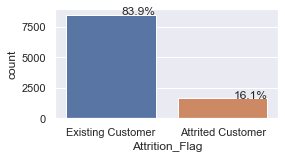

In [205]:
plt.figure(figsize=(4,2))
ax = sns.countplot(x=df['Attrition_Flag'])
total = len(df['Attrition_Flag'])
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='right')
plt.show()

In [206]:
ex.pie(df,names='Attrition_Flag',title='Propotion Of Different Attrition_Flag',hole=0.33)

<h3>2.Numerical features</h3>

In [15]:
# Creating a list of numerical columns.
numerical_cols = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

In [360]:
df.skew()

CLIENTNUM                   0.996
Customer_Age               -0.034
Dependent_count            -0.021
Months_on_book             -0.107
Total_Relationship_Count   -0.162
Months_Inactive_12_mon      0.633
Contacts_Count_12_mon       0.011
Credit_Limit                1.667
Total_Revolving_Bal        -0.149
Avg_Open_To_Buy             1.662
Total_Amt_Chng_Q4_Q1        1.732
Total_Trans_Amt             2.041
Total_Trans_Ct              0.154
Total_Ct_Chng_Q4_Q1         2.064
Avg_Utilization_Ratio       0.718
dtype: float64

In [367]:
n = len(numerical_cols)
n

14

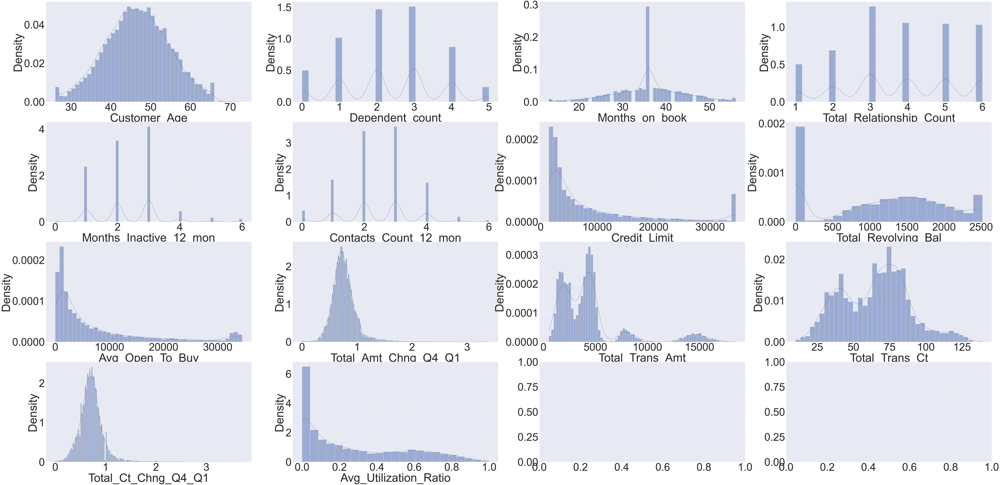

In [17]:
n = len(numerical_cols)
sns.set(font_scale=8) 

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10*n,5*n) )

for i in range(n):
    j = i//4
    k = i % 4
    sns.histplot(df[numerical_cols[i]],kde=True, stat='density', ax=axes[j][k])
    
    

In [18]:
#distribution
n = len(numerical_cols)
sns.set(font_scale=8) 

fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(10*n,40*n) )

for i in range(n):
    sns.histplot(df[numerical_cols[i]],kde=True, stat='density', ax=axes[i][0])
    
    sns.boxplot(x=df[numerical_cols[i]], ax=axes[i][1])

####  Observations
* The Customer_Age distribution is fairly normal but slightly left-skewed.
* The Dependent_count distribution is also fairly normal but slightly left-skewed.
* The Months_on_book distribution is fairly normal but slightly left-skewed. but 85% of customer have used cards more than 27 months, the new users (less than 27 months), which means that credit card business is a mature business that it focus on keeping the customers instead of recuriting the new customers
* The Total_Relationship_Count distribution is fairly normal but slightly left-skewed.
* The Months_Inactive_12_mon distribution is right-skewed.
* The Contacts_Count_12_mon distribution is fairly normal but slightly right-skewed.
* The Credit_Limit distribution is very right-skewed.
* The Total_Revolving_Bal distribution is fairly normal but slightly left-skewed due to many customers with very low balances.
* The Avg_Open_To_Buy distribution is very right-skewed.
* The Total_Amt_Chng_Q4_Q1 distribution is very right-skewed.
* The Total_Trans_Amt distribution is very right-skewed.
* The Total_Trans_Ct distribution is fairly normal but slightly right-skewed.
* The Total_Ct_Chng_Q4_Q1 distribution is very right-skewed.
* The Avg_Utilization distribution is right-skewed.

<h3>2.Categorical features</h3>

In [25]:
categorical_cols = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

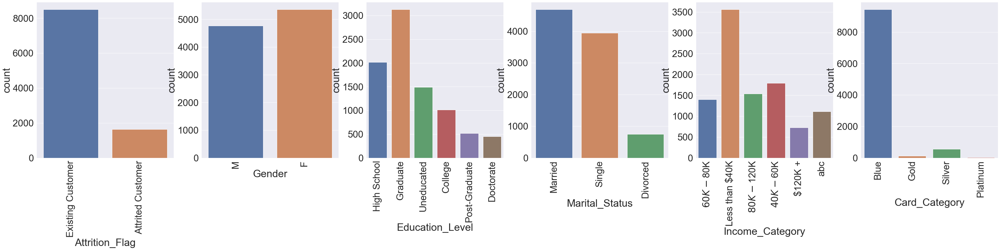

In [19]:

n = len(categorical_cols)
sns.set(font_scale=3) 

fig, axes = plt.subplots(nrows=1, ncols=n, figsize=(10*n,10) )

for i in range(n):
    axes[i].tick_params(axis="x",labelrotation=90)
    sns.countplot(x = categorical_cols[i],data=df, ax=axes[i])
    



In [31]:
ex.pie(df,names='Gender',title='Propotion Of Different Gender',hole=0.33)



In [10]:
ex.pie(df,names='Education_Level',title='Propotion Of Different Education_Level',hole=0.33)

In [11]:
ex.pie(df,names='Marital_Status',title='Propotion Of Different Marriage Statuses',hole=0.33)

In [12]:
ex.pie(df,names='Income_Category',title='Propotion Of Different Income_Category',hole=0.33)

In [13]:
ex.pie(df,names='Card_Category',title='Propotion Of Different Card_Category',hole=0.33)

####  Observations 
* **Attrition_Flag** : most of the customers is existing and then we see a much smaller number of attrited customers that closed their account.
* **Gender** : most of the customers is female, but it is not a huge difference. 
* **Education_Level** : most of the customers is Graduate. The second largest group is High-School. 
* **Marital_Status** : most customers is Married. The second largest is Single. The smallest group is those that are Divorced.
* **Income_Category** : most of the customers is less than 40K. The second largest group is the next bin up at $40K-60K. We also notice a large group of customers with an incorrect category of 'abc' that we can probably remove and treat for.  
* **Card_Category** : most of the customers is Blue. The second largest group is Silver members. If we assume that Blue is the base card then we can probably bin these categories to the 'Basic Members' and 'Premium Members'.


<h3>3.Correlation between Numerical features</h3>

<AxesSubplot:>

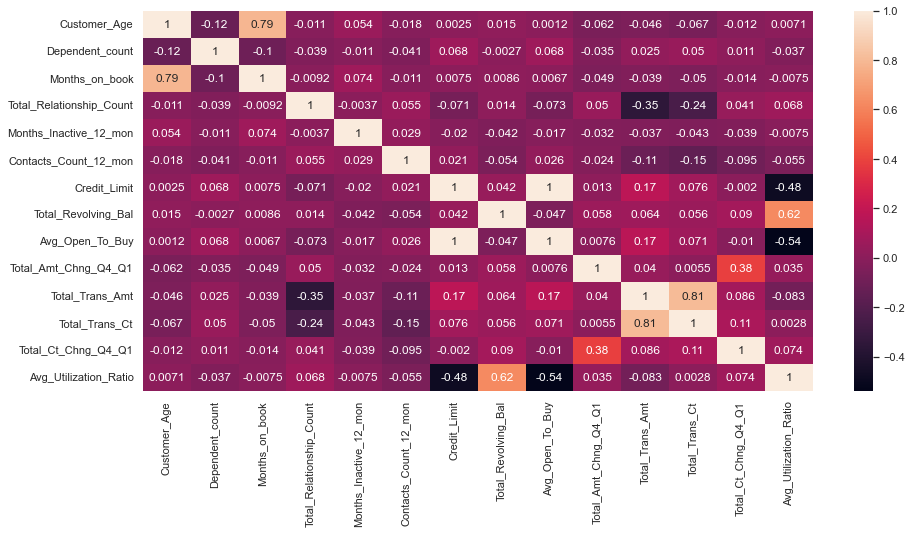

In [21]:
plt.figure(figsize=(15, 7))
sns.set(font_scale=1) 
sns.heatmap(df[numerical_cols].corr(), annot=True)

####  Observations
* We don't see many significant correlations throughout the set, except for a few noticeable exceptions.
* The most notable correlation is the direct positive correlation seen between **Credit_Limit** and **Avg_Open_To_Buy**.
* We also see very strong positive correlations between **Months_on_book** and **Customer_Age**, **Total_Trans_Amt** and **Total_Trans_Ct**, and **Total_Revolving_Bal** and **Avg_Utilization_Ratio**.
* The strongest negative correlations are seen between both **Avg_Open_To_Buy** and **Credit_Limit** with **Avg_Utilization_Ratio**.
* There are also a few other positive correlations like **Total_Ct_Chng_Q4_Q1** and **Total_Amt_Chng_Q4_Q1**, and some other negative correlations; however, these are all not as strong as the previously mentioned correlations.

<h3>4.Correlation between Categorical features (Chi-square, Phik)</h3>

In [285]:
categorical_cols
n = len(categorical_cols)
resultant = pd.DataFrame(data=[(0 for i in range(n)) for i in range(n)], 
                         columns=list(categorical_cols))

resultant

df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000


In [288]:
resultant.set_index(pd.Index(list(categorical_cols)), inplace = True)

# Finding p_value for all columns and putting them in the resultant matrix
for i in list(categorical_cols):
    for j in list(categorical_cols):
        if i != j:
            mycrosstab=pd.crosstab(df[i],df[j])
            stat,p,dof,expected=stats.chi2_contingency(mycrosstab)
            resultant.loc[i,j] = p
               
print(resultant)

                 Attrition_Flag  Gender  Education_Level  Marital_Status  \
Attrition_Flag            0.000   0.000            0.038           0.071   
Gender                    0.000   0.000            0.215           0.310   
Education_Level           0.038   0.215            0.000           0.153   
Marital_Status            0.071   0.310            0.153           0.000   
Income_Category           0.015   0.000            0.227           0.458   
Card_Category             0.525   0.000            0.308           0.000   

                 Income_Category  Card_Category  
Attrition_Flag             0.015          0.525  
Gender                     0.000          0.000  
Education_Level            0.227          0.308  
Marital_Status             0.458          0.000  
Income_Category            0.000          0.000  
Card_Category              0.000          0.000  


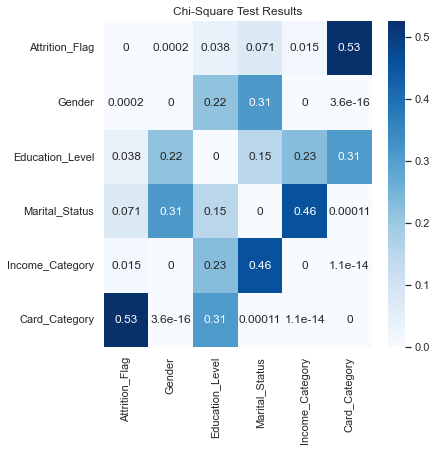

In [289]:
fig = plt.figure(figsize=(6,6))
sns.heatmap(resultant, annot=True, cmap='Blues')
plt.title('Chi-Square Test Results')
plt.show()

interval columns not set, guessing: ['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


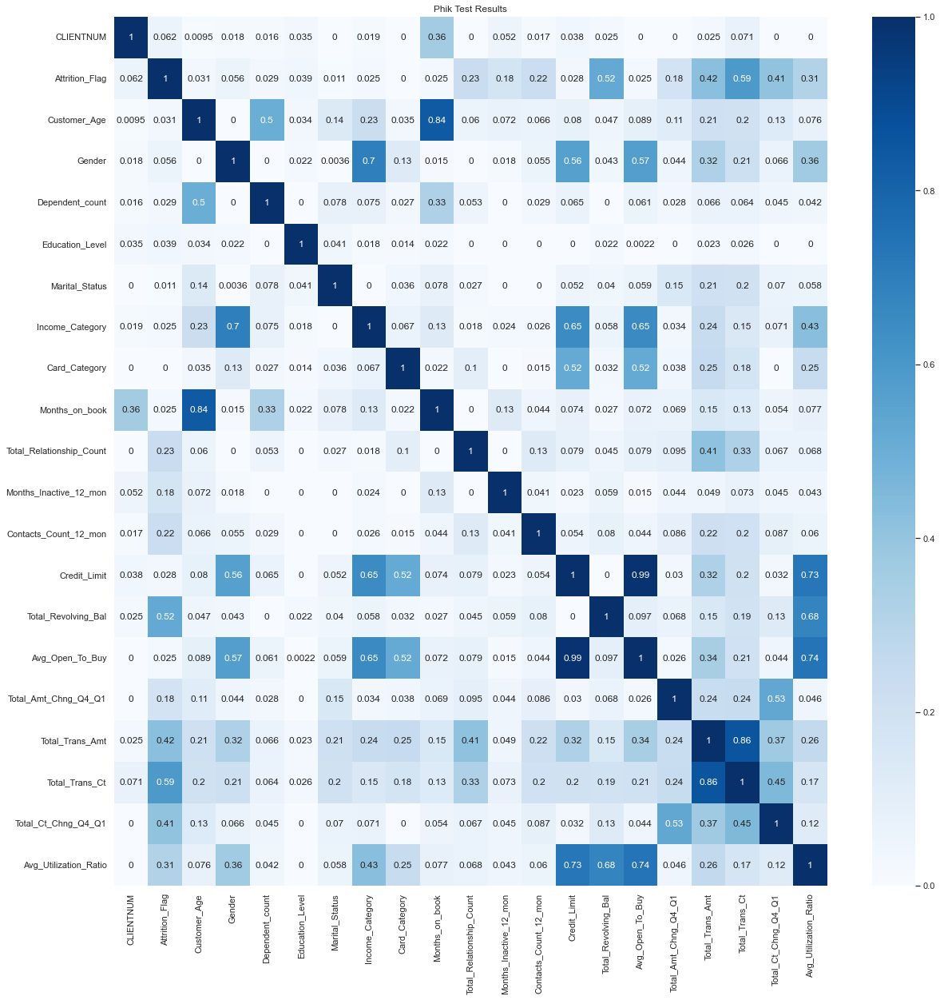

In [295]:
result = df.phik_matrix()

fig = plt.figure(figsize=(20,20))
sns.heatmap(result, annot=True, cmap='Blues')
plt.title('Phik Test Results')
plt.show()

<h3>5.Relationship between Attrition_Flag and Numerical features</h3>

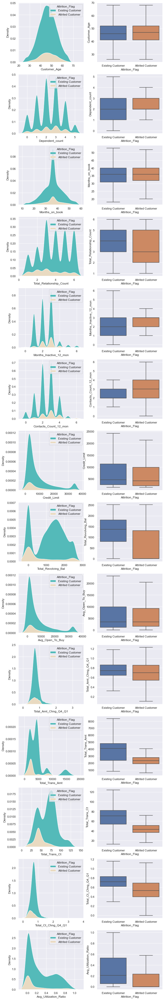

In [169]:
n = len(numerical_cols)
fig, axes = plt.subplots(nrows= n, ncols=2, figsize=(10,5*n) )

for i in range(n):
    #axes[i].tick_params(axis="x",labelrotation=90)

    sns.kdeplot(df[numerical_cols[i]], fill=True, alpha=1, hue = df['Attrition_Flag'], 
                palette=('#54BAB9', '#E9DAC1'), multiple='stack', ax=axes[i][0])
    sns.boxplot(x='Attrition_Flag', y=numerical_cols[i], data=df, showfliers=False, ax=axes[i][1])


In [159]:
df.groupby(["Attrition_Flag"])[numerical_cols].mean()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,,,,,
Attrited Customer,46.659,2.403,36.178,3.280,2.693,2.972,8136.039,672.823,7463.216,0.694,3095.026,44.934,0.554,0.162
Existing Customer,46.262,2.335,35.881,3.915,2.274,2.356,8726.878,1256.604,7470.273,0.773,4654.656,68.673,0.742,0.296


####  Observations 
* The most notable difference between active and closed accounts can be seen in the means for **Total_Revolving_Bal** and **Avg_Utilization_Ratio** as the existing customers have a mean nearly double that of the attrited customers.
* There is also a significant difference between the two customer types in the **Total_Trans_Amt** and **Total_Trans_Ct** as we see the existing customers have signifcantly larger means in these two columns.

####  Futures may related to Churn
* ***Total_Revolving_Bal，Total_Trans_Amt，Total_Trans_Ct and Avg_Utilization_Ratio***

<h3>5.Relationship between Attrition_Flag and Categorical features</h3>

Text(0, 0.5, 'Percentage Active/Inactive %')

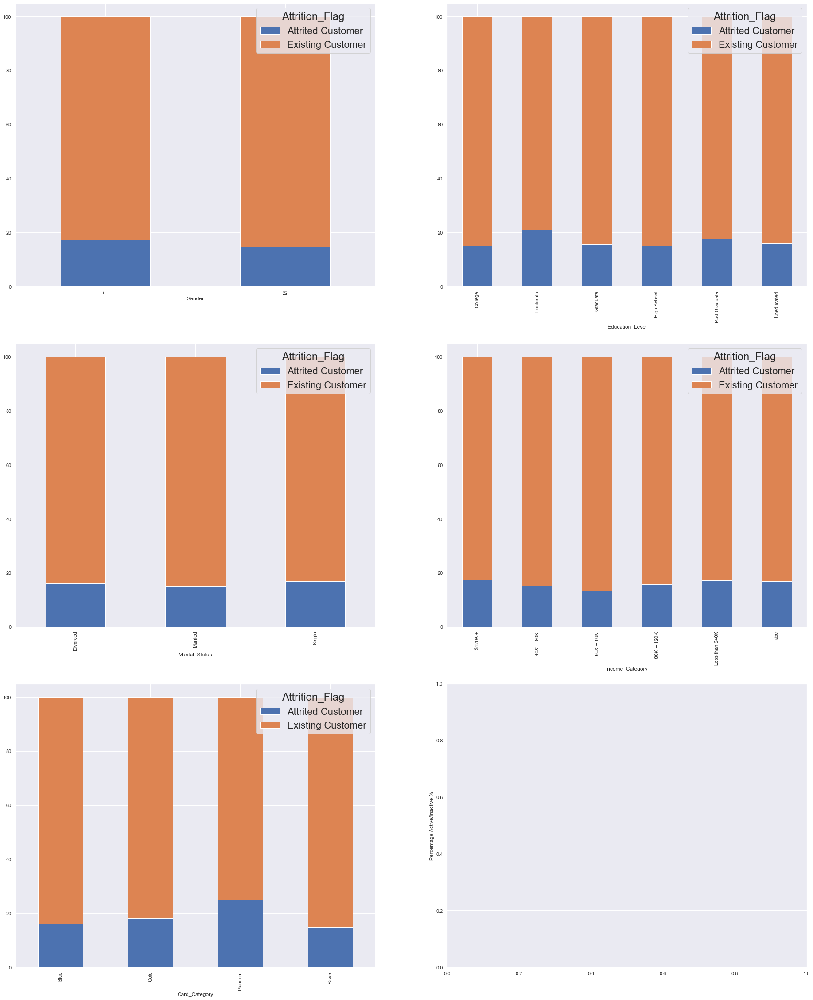

In [23]:
# Plot crosstab percentages across the categorical columns based on Attrition_Flag values
n = len(categorical_cols)
fig, axes = plt.subplots(nrows= 3, ncols=2, figsize=(32, 40) )
sns.set(font_scale=2) 
(pd.crosstab(df[categorical_cols[1]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[0][0])
(pd.crosstab(df[categorical_cols[2]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[0][1])
(pd.crosstab(df[categorical_cols[3]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[1][0])
(pd.crosstab(df[categorical_cols[4]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[1][1])
(pd.crosstab(df[categorical_cols[5]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[2][0])

plt.ylabel("Percentage Active/Inactive %")

####  Observations 
* A slightly larger percentage of women closed their accounts.
* Customers with 'Doctorate' followed by 'Post-Graduate' Educational Qualification rate have a higher attrition rate when compared to others.

* The attrition rates are quite similar across marital statuses as well, but the single members do have a slightly higher percentage.
* The attrition rate is also similar across income bins, but those making <$40K have a slightly higher percentage than the others.
* The attrition rate across the card types is also quite similar, but unexpectedly we do see that the 'Platinum' members have the highest attrition rate and it is one of the most signifcant differences across any of the categorical columns.

<h3>6.Relationship between Attrition_Flag and Card_Category</h3>

In [25]:
category_churn = pd.pivot_table(df, values=['CLIENTNUM'], columns=['Attrition_Flag'], index=['Card_Category'], aggfunc='count', margins=True)

In [26]:
category_churn

CLIENTNUM                         
Attrition_Flag Attrited Customer Existing Customer    All
Card_Category                                            
Blue                        1519              7917   9436
Gold                          21                95    116
Platinum                       5                15     20
Silver                        82               473    555
All                         1627              8500  10127

In [34]:
category_churn[('CLIENTNUM', 'Attrited Customer')]

Card_Category
Blue        1519
Gold          21
Platinum       5
Silver        82
All         1627
Name: (CLIENTNUM, Attrited Customer), dtype: int64

In [58]:
category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum']

5

In [86]:
attrited_num = []
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Blue'])
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Silver'])
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Gold'])
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum'])
existing_num = []
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Blue'])
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Silver'])
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Gold'])
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Platinum'])
churn_percentage = []
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Blue']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Blue']+category_churn[('CLIENTNUM', 'Existing Customer')]['Blue']))
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Silver']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Silver']+category_churn[('CLIENTNUM', 'Existing Customer')]['Silver']))
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Gold']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Gold']+category_churn[('CLIENTNUM', 'Existing Customer')]['Gold']))
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum']+category_churn[('CLIENTNUM', 'Existing Customer')]['Platinum']))


In [87]:
category_churn_group = pd.DataFrame()
category_churn_group['Card_category'] =['Blue','Silver','Gold','Platinum']
category_churn_group['Attrited'] = attrited_num
category_churn_group['Existing'] = existing_num
category_churn_group['Churn_percentage'] = churn_percentage

In [88]:
category_churn_group

,Card_category,Attrited,Existing,Churn_percentage
0,Blue,1519,7917,16.098
1,Silver,82,473,14.775
2,Gold,21,95,18.103
3,Platinum,5,15,25.000


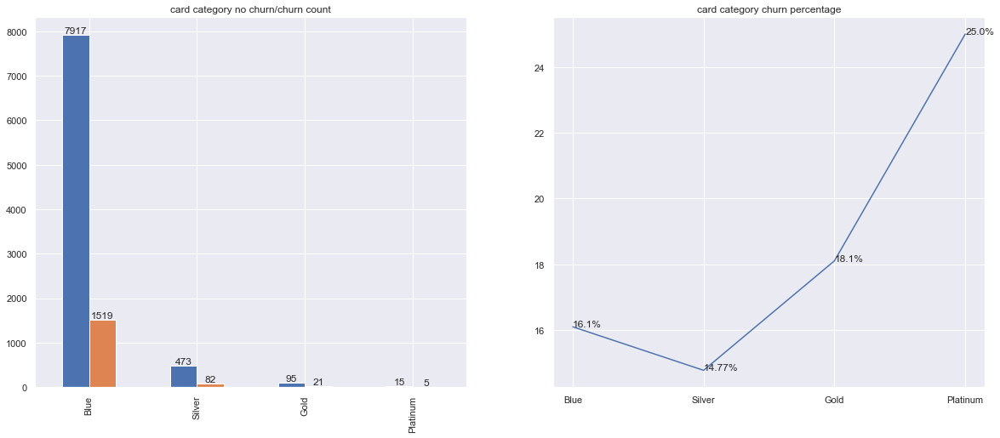

In [137]:
fig, axes = plt.subplots(nrows=1, ncols=2)

subplot = category_churn_group[['Existing','Attrited']].plot(kind='bar',ax=axes[0], title = "card category no churn/churn count", figsize=(20,8), legend=False)
for container in axes[0].containers:
    axes[0].bar_label(container)
#subplot.yaxis.set_major_formatter(PercentFormatter())

category_churn_group['Churn_percentage'].plot(kind='line',ax=axes[1], title="card category churn percentage", figsize=(20,8), legend=False)
for container in axes[1].containers:
    axes[1].line_label(container)
    
axes[0].set_xticklabels(category_churn_group['Card_category'])
axes[1].set_xticks([0,1,2,3])
axes[1].set_xticklabels(category_churn_group['Card_category'])

for i, j in zip([0,1,2,3],category_churn_group['Churn_percentage']):
    
    axes[1].annotate(str(round(j,2))+'%', xy=(i,j))

####  Observations 
* Blue, Gold and Platinum card customers churn rate is higher than average churn rate 16%. They are 16.1%, 18.1% and 25.0% respectively
* Blue card churned customers made 93% of all churned customers, which is the main reason of customer churned

<h3>7.Different Card Category Customers behavior analysis </h3>

In [175]:
behavior_features =['Total_Relationship_Count','Avg_Utilization_Ratio','Months_Inactive_12_mon','Contacts_Count_12_mon',
                    'Credit_Limit','Total_Revolving_Bal','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Avg_Open_To_Buy','Months_on_book']

len(behavior_features)

12

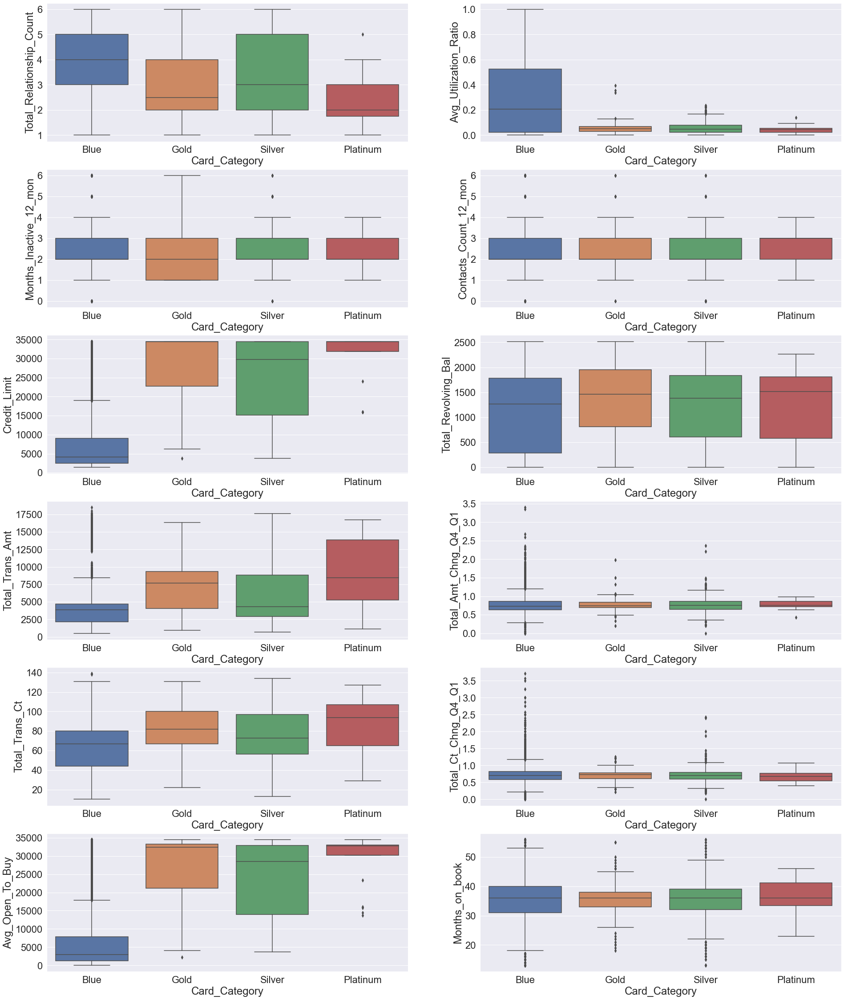

In [178]:
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(32, 40))
sns.set(font_scale=1) 
for i in range(len(behavior_features)):
    j = i // 2
    k = i % 2
    sns.boxplot(x='Card_Category', y=behavior_features[i], data=df, ax = axes[j][k])


####  Customer with Different type Cards Observations 
* Gold and Platinum card customers use less than bank products than Blue and Sliver customers. We need to improve retention of them.  One suggestion will be that we design some bank products and sell them to the Gold and Platinum card customers.
* Some of Blue card holders' ***credit limit*** and ***Avg_Open_To_Buy*** are much higher than other Blue card customers, their use behaviors are similar to Sliver card customers. One suggestion will be that recommending upgrading their Blue cards free of charge to get better service and improve their retention. 
* Gold and Platinum card customers have higher ***credit limit*** and ***Total_Trans_Ct*** than Blue card customers but have higher churn rate. Their ***Avg_Open_To_Buy*** are close to ***credit limit***, so there is no issue about it.


<h2>Feature Engineering</h2>

<h3>Change the column **Attrition_Flag** to 0 or 1 </h3>

In [26]:
df = pd.read_csv("BankChurners_final.csv")

df['class'] = df['Attrition_Flag'].map({'Attrited Customer':1, 'Existing Customer':0})
df = df.drop('Attrition_Flag', axis=1)

In [27]:
df.head()


,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class
0,768805383,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,0
1,818770008,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,0
2,713982108,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,0
3,769911858,40,F,4,High School,NaN,Less than $40K,Blue,34,3,...,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,0
4,709106358,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000,0


In [28]:
data = deepcopy(df)

In [29]:
categorical_cols = [
    "Attrition_Flag",
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]
categorical_cols.remove('Attrition_Flag')

<h3>Change the categorical features to Ordinal encoding and One hot encoding</h3>

Label encoder is used for label feature, one hot encoder is used for unordered categorical features, ordinal encoder is used for ordered categorical features. For example, ***Education_Level***, ***Income_Category***, ***Card_Category*** are ordered features, so we will use ordinal encoder. 



In [30]:
onehot_cols = ['Gender']

In [31]:
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res) 

for feature in onehot_cols:
    data = encode_and_bind(data, feature)

In [32]:
data.head()

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class,Gender_F,Gender_M
0,768805383,45,3,High School,Married,$60K - $80K,Blue,39,5,1,...,777,11914.000,1.335,1144,42,1.625,0.061,0,0,1
1,818770008,49,5,Graduate,Single,Less than $40K,Blue,44,6,1,...,864,7392.000,1.541,1291,33,3.714,0.105,0,1,0
2,713982108,51,3,Graduate,Married,$80K - $120K,Blue,36,4,1,...,0,3418.000,2.594,1887,20,2.333,0.000,0,0,1
3,769911858,40,4,High School,NaN,Less than $40K,Blue,34,3,4,...,2517,796.000,1.405,1171,20,2.333,0.760,0,1,0
4,709106358,40,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,...,0,4716.000,2.175,816,28,2.500,0.000,0,0,1


In [33]:
ordinalencoder = OrdinalEncoder(categories=[["Uneducated", "High School", "College", "Graduate", "Post-Graduate", "Doctorate"],
                                          ["Single", "Married", "Divorced"],
                                          ["Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"],
                                          ["Blue", "Silver", "Gold", "Platinum"]],
                              handle_unknown="use_encoded_value",
                              unknown_value=np.nan)

In [34]:
features_missing = ["Education_Level", "Marital_Status", "Income_Category"]
ordinal_cols = features_missing + ["Card_Category"]

data[ordinal_cols] = ordinalencoder.fit_transform(data[ordinal_cols])

In [35]:
data.head()
data.to_csv("BankChurners_fill_data.csv", index=False)

<h3>Generate X and y</h3>

In [36]:
data = pd.read_csv("BankChurners_fill_data.csv")

X = data.drop(columns="class")

y = data["class"]

In [37]:
X.head()

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_F,Gender_M
0,768805383,45,3,1.000,1.000,2.000,0.000,39,5,1,...,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,0,1
1,818770008,49,5,3.000,0.000,0.000,0.000,44,6,1,...,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,1,0
2,713982108,51,3,3.000,1.000,3.000,0.000,36,4,1,...,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,0,1
3,769911858,40,4,1.000,NaN,0.000,0.000,34,3,4,...,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,1,0
4,709106358,40,3,0.000,1.000,2.000,0.000,21,5,1,...,4716.000,0,4716.000,2.175,816,28,2.500,0.000,0,1


In [38]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: class, dtype: int64

<h3>Splitting the data into train/test</h3>

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=1234)

y_train.to_csv("y_train.csv", index=False)
y_test.to_csv("y_test.csv", index=False)


<h3>Fill missing values</h3>

In [40]:
# Save X_train, X_test to files
X_train["Card_Category"] = X_train["Card_Category"].astype("int64")
X_train.to_csv("X_train1.csv", index=False)

X_test["Card_Category"] = X_test["Card_Category"].astype("int64")
X_test.to_csv("X_test1.csv", index=False)


In [41]:
feature_complete = list(set(X_train.columns) - set(features_missing))

n_clusters = {"Education_Level": 6, "Marital_Status": 3, "Income_Category": 5}

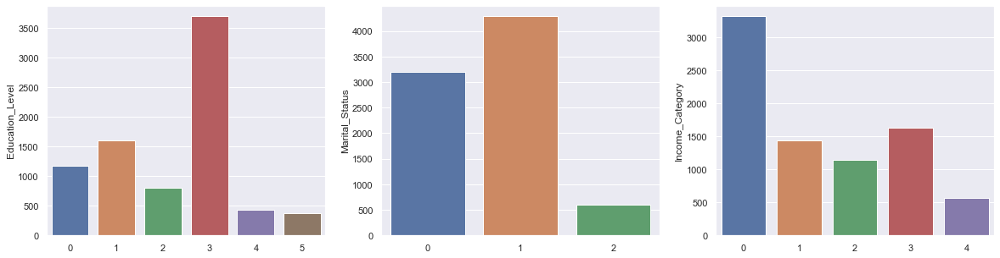

In [239]:
#Method 1: Kmeans clustering + smote
X_train = pd.read_csv("X_train1.csv")
X_fc = X_train[feature_complete]
def KMeansImpute(X_train, X_fc, column):
    
    index_fit, index_pred = X_train.index[~pd.isnull(X_train[column])], X_train.index[pd.isnull(X_train[column])]
    
    
    X_fit, X_pred = X_fc.loc[index_fit], X_fc.loc[index_pred]
    y_fit = X_train.loc[index_fit, column]
    
    sm = SMOTE(random_state=0)
    X_sm, y_sm = sm.fit_resample(X_fit, y_fit)
    kmeans = KMeans(n_clusters[column], random_state=0).fit(X_sm)
    cluster = pd.Series(kmeans.predict(X_fc), name="cluster", index=X_train.index)
    t = pd.concat([X_train[column], cluster], axis=1).groupby("cluster")[column].value_counts()
    
    dimpute = {i: t[i].idxmax() for i in range(n_clusters[column])}
    
    X_train.loc[index_pred, column] = cluster.map(dimpute)
    
    
KMeansImpute(X_train, X_fc, "Education_Level")
KMeansImpute(X_train, X_fc, "Marital_Status")
KMeansImpute(X_train, X_fc, "Income_Category")
X_train[features_missing] = X_train[features_missing].astype("int64")


plt.figure(figsize=(20, 5))
for i, fea in enumerate(features_missing):
    plt.subplot(1, 3, i+1)
    s = X_train[fea].value_counts(sort=False)
    sns.barplot(x=s.index, y=s)


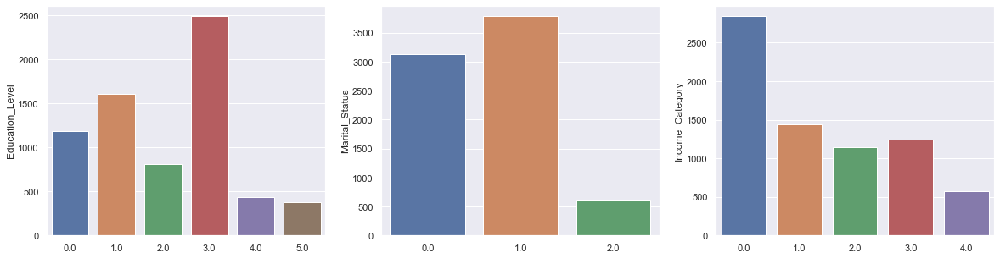

In [240]:
X_train = pd.read_csv("X_train1.csv")

plt.figure(figsize=(20, 5))
for i, fea in enumerate(features_missing):
    plt.subplot(1, 3, i+1)
    s = X_train[fea].value_counts(sort=False)
    sns.barplot(x=s.index, y=s)

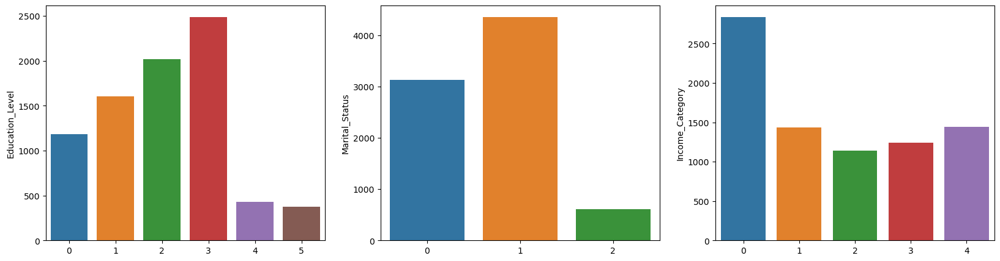

In [42]:
#Method 2: Logistic regression with loss weight
X_train = pd.read_csv("X_train1.csv")
X_fc = X_train[feature_complete]
def LogisticRegressionImpute(X_train, X_fc, column):
    index_fit, index_pred = X_train.index[~pd.isnull(X_train[column])], X_train.index[pd.isnull(X_train[column])]
    X_fit, X_pred = X_fc.loc[index_fit], X_fc.loc[index_pred]
    y_fit = X_train.loc[index_fit, column]
    X_fit = (X_fit - X_fit.mean()) / X_fit.std()
    lr = LogisticRegression(class_weight="balanced", random_state=0, solver="saga", max_iter=500).fit(X_fit, y_fit)
    X_train.loc[index_pred, column] = lr.predict(X_pred)

    
LogisticRegressionImpute(X_train, X_fc, "Education_Level")
LogisticRegressionImpute(X_train, X_fc, "Marital_Status")
LogisticRegressionImpute(X_train, X_fc, "Income_Category")
X_train[features_missing] = X_train[features_missing].astype("int64")

plt.figure(figsize=(20, 5))
for i, fea in enumerate(features_missing):
    plt.subplot(1, 3, i+1)
    s = X_train[fea].value_counts(sort=False)
    sns.barplot(x=s.index, y=s)

In [43]:
onehotencoder_ms = OneHotEncoder(categories=[[0, 1, 2]], handle_unknown="ignore", sparse=False)
t = onehotencoder_ms.fit_transform(X_train["Marital_Status"].values.reshape(-1, 1))
t = pd.DataFrame(t, columns=["Marital_Status_" + s for s in ["Single", "Married", "Divorced"]], index=X_train.index, dtype="int64")
X_train = pd.concat([X_train, t], axis=1)
X_train.drop(columns=["Marital_Status"], inplace=True)

In [44]:
X_train.head()

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_F,Gender_M,Marital_Status_Single,Marital_Status_Married,Marital_Status_Divorced
0,714543633,45,3,2,0,0,36,1,2,5,...,0.576,8024,78,0.696,0.000,1,0,1,0,0
1,711426033,49,2,3,3,0,39,3,2,2,...,0.857,3806,65,0.667,0.083,0,1,0,1,0
2,709957158,48,4,1,1,0,40,5,1,2,...,0.852,3942,65,0.625,0.895,0,1,0,1,0
3,711826983,47,3,2,1,0,36,4,3,6,...,0.655,3240,38,0.652,0.000,1,0,0,1,0
4,711925608,42,4,3,3,0,35,3,2,2,...,0.681,3886,81,0.800,0.089,0,1,0,0,1


In [45]:
X_train.to_csv("X_train_onehot_ordinal.csv", index=False)


In [46]:
X_test = pd.read_csv("X_test1.csv")

LogisticRegressionImpute(X_test, X_fc, "Education_Level")
LogisticRegressionImpute(X_test, X_fc, "Marital_Status")
LogisticRegressionImpute(X_test, X_fc, "Income_Category")
X_test[features_missing] = X_test[features_missing].astype("int64")

onehotencoder_ms = OneHotEncoder(categories=[[0, 1, 2]], handle_unknown="ignore", sparse=False)
t = onehotencoder_ms.fit_transform(X_test["Marital_Status"].values.reshape(-1, 1))
t = pd.DataFrame(t, columns=["Marital_Status_" + s for s in ["Single", "Married", "Divorced"]], index=X_test.index, dtype="int64")
X_test = pd.concat([X_test, t], axis=1)
X_test.drop(columns=["Marital_Status"], inplace=True)

X_test


,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_F,Gender_M,Marital_Status_Single,Marital_Status_Married,Marital_Status_Divorced
0,804344733,46,3,5,0,0,41,3,2,2,...,0.807,4303,89,0.780,0.473,1,0,1,0,0
1,779951058,54,3,1,1,0,38,4,2,4,...,0.935,1908,39,0.696,0.321,1,0,0,1,0
2,808796208,54,2,5,1,0,49,5,3,2,...,0.967,1532,44,0.692,0.460,1,0,0,0,1
3,809797158,42,2,0,3,0,37,3,3,4,...,0.679,3627,66,1.000,0.082,0,1,1,0,0
4,708679383,44,2,5,0,0,32,5,1,3,...,0.667,1775,55,1.037,0.366,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021,711550983,46,1,3,1,0,37,1,2,2,...,0.699,8313,107,0.672,0.104,0,1,0,0,1
2022,778420383,49,1,3,4,0,29,2,3,2,...,0.891,8609,109,0.758,0.267,0,1,0,1,0
2023,795613233,48,2,3,1,0,42,4,2,0,...,0.649,4949,76,0.810,0.142,1,0,0,1,0
2024,711783483,55,3,4,1,0,46,4,3,2,...,0.842,3562,72,0.895,0.191,1,0,1,0,0


For unblanced data set, it is better to use logistic regression to fill missing values, since k-means will fill missing values with the values with largest counts

In [47]:
X_test.to_csv("X_test_onehot_ordinal.csv", index=False)


<h3>Use one hot encoder for all categorical data</h3>

In [48]:
X_train2 = pd.read_csv("X_train_onehot_ordinal.csv")
X_test2 = pd.read_csv("X_test_onehot_ordinal.csv")

#Education_Level,Income_Category,Card_Category
def convert_one_hot(X_train):
    onehotencoder_el = OneHotEncoder(categories=[[0, 1, 2,3,4,5]], handle_unknown="ignore", sparse=False)
    t = onehotencoder_el.fit_transform(X_train["Education_Level"].values.reshape(-1, 1))
    t = pd.DataFrame(t, columns=["Education_Level_" + s for s in ["Uneducated", "High School", "College", "Graduate", "Post-Graduate", "Doctorate"]], index=X_train.index, dtype="int64")
    X_train = pd.concat([X_train, t], axis=1)
    X_train.drop(columns=["Education_Level"], inplace=True)

    onehotencoder_ic = OneHotEncoder(categories=[[0, 1, 2,3,4]], handle_unknown="ignore", sparse=False)
    t = onehotencoder_ic.fit_transform(X_train["Income_Category"].values.reshape(-1, 1))
    t = pd.DataFrame(t, columns=["Income_Category_" + s for s in ["Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"]], index=X_train.index, dtype="int64")
    X_train = pd.concat([X_train, t], axis=1)
    X_train.drop(columns=["Income_Category"], inplace=True)


    onehotencoder_cc = OneHotEncoder(categories=[[0, 1, 2,3]], handle_unknown="ignore", sparse=False)
    t = onehotencoder_cc.fit_transform(X_train["Card_Category"].values.reshape(-1, 1))
    t = pd.DataFrame(t, columns=["Card_Category_" + s for s in ["Blue", "Silver", "Gold", "Platinum"]], index=X_train.index, dtype="int64")
    X_train = pd.concat([X_train, t], axis=1)
    X_train.drop(columns=["Card_Category"], inplace=True)
    
    return X_train

X_train_one_hot = convert_one_hot(X_train2)
X_test_one_hot = convert_one_hot(X_test2)

X_train_one_hot.to_csv("X_train_onehot.csv", index=False)
X_test_one_hot.to_csv("X_test_onehot.csv", index=False)


In [340]:
X_test_one_hot

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Education_Level_Doctorate,Income_Category_Less than $40K,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_$120K +,Card_Category_Blue,Card_Category_Silver,Card_Category_Gold,Card_Category_Platinum
0,804344733,46,3,41,3,2,2,1937.000,916,1021.000,...,1,1,0,0,0,0,1,0,0,0
1,779951058,54,3,38,4,2,4,5122.000,1642,3480.000,...,0,0,1,0,0,0,1,0,0,0
2,808796208,54,2,49,5,3,2,5476.000,2517,2959.000,...,1,0,1,0,0,0,1,0,0,0
3,809797158,42,2,37,3,3,4,19366.000,1592,17774.000,...,0,0,0,0,1,0,1,0,0,0
4,708679383,44,2,32,5,1,3,4852.000,1777,3075.000,...,1,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021,711550983,46,1,37,1,2,2,11343.000,1175,10168.000,...,0,0,1,0,0,0,1,0,0,0
2022,778420383,49,1,29,2,3,2,7650.000,2045,5605.000,...,0,0,0,0,0,1,1,0,0,0
2023,795613233,48,2,42,4,2,0,10514.000,1494,9020.000,...,0,0,1,0,0,0,1,0,0,0
2024,711783483,55,3,46,4,3,2,5162.000,984,4178.000,...,0,0,1,0,0,0,1,0,0,0


<h3>Drop the column **CLIENTNUM** as it is unique for each customer and will not add value to the model</h3>

In [324]:
X_train.drop(columns=["CLIENTNUM"], inplace=True)

<h2>Feature Selection</h2>

In [342]:
#ch-square to find the most important features
X_train = pd.read_csv("X_train_onehot.csv")
X_test = pd.read_csv("X_test_onehot.csv")

X_train.drop(columns=["CLIENTNUM"], inplace=True)
X_test.drop(columns=["CLIENTNUM"], inplace=True)

bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X_train,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_train.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']
featureScores.sort_values(by='Score', ascending=False)

,Specs,Score
10,Total_Trans_Amt,593151.131
7,Total_Revolving_Bal,328397.099
6,Credit_Limit,22104.462
11,Total_Trans_Ct,9439.043
8,Avg_Open_To_Buy,4433.201
5,Contacts_Count_12_mon,174.437
3,Total_Relationship_Count,111.407
4,Months_Inactive_12_mon,80.404
13,Avg_Utilization_Ratio,70.883
12,Total_Ct_Chng_Q4_Q1,55.455


In [343]:
#ch-square to find the most important features
X_train = pd.read_csv("X_train_onehot_ordinal.csv")
X_test = pd.read_csv("X_test_onehot_ordinal.csv")

X_train.drop(columns=["CLIENTNUM"], inplace=True)
X_test.drop(columns=["CLIENTNUM"], inplace=True)

bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X_train,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_train.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']
featureScores.sort_values(by='Score', ascending=False)

,Specs,Score
13,Total_Trans_Amt,593151.131
10,Total_Revolving_Bal,328397.099
9,Credit_Limit,22104.462
14,Total_Trans_Ct,9439.043
11,Avg_Open_To_Buy,4433.201
8,Contacts_Count_12_mon,174.437
6,Total_Relationship_Count,111.407
7,Months_Inactive_12_mon,80.404
16,Avg_Utilization_Ratio,70.883
15,Total_Ct_Chng_Q4_Q1,55.455


<h2>Model Building</h2>

In [49]:
X_train = pd.read_csv("X_train_onehot_ordinal.csv")
X_test = pd.read_csv("X_test_onehot_ordinal.csv")

y_train = pd.read_csv("y_train.csv")
y_test = pd.read_csv("y_test.csv")

X_train.drop(columns=["CLIENTNUM"], inplace=True)
X_test.drop(columns=["CLIENTNUM"], inplace=True)

models = []  # Empty list to store all the models

# Appending models into the list with default parameters and random_state=1
models.append(("LogisticRegression", LogisticRegression(random_state=1234,class_weight='balanced')))
models.append(("DecisionTree", DecisionTreeClassifier(random_state=1234,class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(random_state=1234)))
models.append(("RandomForest", RandomForestClassifier(random_state=1234,class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1234)))
models.append(("XGB",  XGBClassifier(random_state=1234,class_weight='balanced')))
models.append(("Adaboost", AdaBoostClassifier(random_state=1234)))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train)) 
    print("{}: {}".format(name, scores))
    
print("\n" "Test Performance:(recall     auc)" "\n")
for name, model in models:
    y_pred =model.predict(X_test)
    scores = recall_score(y_test, y_pred) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)  
    print("{}: {}\t{}".format(name, scores, metrics.auc(fpr, tpr)))


Training Performance:

LogisticRegression: 0.8287461773700305
DecisionTree: 1.0
Bagging: 0.9686544342507645
RandomForest: 1.0
GBM: 0.8837920489296636
[18:22:15] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-030221e36e1a46bfb-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

XGB: 1.0
Adaboost: 0.8585626911314985

Test Performance:(recall     auc)

LogisticRegression: 0.8213166144200627	0.8131187641520348
DecisionTree: 0.799373040752351	0.8853338548811549
Bagging: 0.8557993730407524	0.9199910749210791
RandomForest: 0.8025078369905956	0.8945169530588596
GBM: 0.8369905956112853	0.9135158016134927
XGB: 0.8683385579937304	0.927432313560427
Adaboost: 0.8432601880877743	0.9140143939853047


<h2>Over-Sampling(SMOTE)</h2>

In [50]:
s = SMOTE(random_state=1234)
X_train_sm, y_train_sm = s.fit_resample(X_train, y_train)

X_train_sm.to_csv("X_train_onehot_ordinal_sm.csv", index=False)
y_train_sm.to_csv("y_train_onehot_ordinal_sm.csv", index=False)

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train).keys()), values=list(Counter(y_train).values()), name='Original data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_train_sm).keys()), values=list(Counter(y_train_sm).values()), name='SMOTE data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="value+percent+name")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE', x=0.82, y=0.5, font_size=12, showarrow=False)])
fig.show()

In [51]:
models = []  # Empty list to store all the models

models.append(("LogisticRegression", LogisticRegression(random_state=1234,class_weight='balanced')))
models.append(("DecisionTree", DecisionTreeClassifier(random_state=1234,class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(random_state=1234)))
models.append(("RandomForest", RandomForestClassifier(random_state=1234,class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1234)))
models.append(("XGB",  XGBClassifier(random_state=1234,class_weight='balanced')))
models.append(("Adaboost", AdaBoostClassifier(random_state=1234)))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train_sm, y_train_sm)
    scores = recall_score(y_train_sm, model.predict(X_train_sm)) 
    print("{}: {}".format(name, scores))
    
print("\n" "Test Performance:(recall     auc)" "\n")
for name, model in models:
    y_pred =model.predict(X_test)
    scores = recall_score(y_test, y_pred) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)  
    print("{}: {}\t{}".format(name, scores, metrics.auc(fpr, tpr)))
    


Training Performance:

LogisticRegression: 0.8174591491240983
DecisionTree: 1.0
Bagging: 0.9979390549094657
RandomForest: 1.0
GBM: 0.9780656558221699
[18:25:02] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-030221e36e1a46bfb-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

XGB: 1.0
Adaboost: 0.9665832474606212

Test Performance:(recall     auc)

LogisticRegression: 0.8025078369905956	0.8081080485480219
DecisionTree: 0.8683385579937304	0.9113221788211182
Bagging: 0.8871473354231975	0.9289280906758635
RandomForest: 0.896551724137931	0.9348019311960891
GBM: 0.9153605015673981	0.9453779660736814
XGB: 0.9028213166144201	0.9432091351671984
Adaboost: 0.896551724137931	0.9277720542189363


<h2>ANN with Tensorflow Model</h2>

In [62]:
y_train.value_counts()


class
0        6793
1        1308
dtype: int64

In [66]:
y_train

,class
0,1
1,0
2,0
3,1
4,0
...,...
8096,0
8097,0
8098,0
8099,0


In [75]:
data2 = pd.read_csv("BankChurners_fill_data.csv")

X = data2.drop(columns="class")

y = data2["class"]

a = y.value_counts()
ratio = a[1]/(a[1]+a[0])
weights = [ratio, 1-ratio]

rs = RobustScaler()
X =rs.fit_transform(X)

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=103)



In [78]:
data2

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class,Gender_F,Gender_M
0,768805383,45,3,1.000,1.000,2.000,0.000,39,5,1,...,777,11914.000,1.335,1144,42,1.625,0.061,0,0,1
1,818770008,49,5,3.000,0.000,0.000,0.000,44,6,1,...,864,7392.000,1.541,1291,33,3.714,0.105,0,1,0
2,713982108,51,3,3.000,1.000,3.000,0.000,36,4,1,...,0,3418.000,2.594,1887,20,2.333,0.000,0,0,1
3,769911858,40,4,1.000,NaN,0.000,0.000,34,3,4,...,2517,796.000,1.405,1171,20,2.333,0.760,0,1,0
4,709106358,40,3,0.000,1.000,2.000,0.000,21,5,1,...,0,4716.000,2.175,816,28,2.500,0.000,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,2,3.000,0.000,1.000,0.000,40,3,2,...,1851,2152.000,0.703,15476,117,0.857,0.462,0,0,1
10123,710638233,41,2,NaN,2.000,1.000,0.000,25,4,2,...,2186,2091.000,0.804,8764,69,0.683,0.511,1,0,1
10124,716506083,44,1,1.000,1.000,0.000,0.000,36,5,3,...,0,5409.000,0.819,10291,60,0.818,0.000,1,1,0
10125,717406983,30,2,3.000,NaN,1.000,0.000,36,4,3,...,0,5281.000,0.535,8395,62,0.722,0.000,1,0,1


Epoch 1/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8327
Epoch 2/80
254/254 [==============================] - 2s 7ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 3/80
254/254 [==============================] - 2s 7ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 4/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 5/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 6/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 7/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 8/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 9/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 10/80
254/254 [==============================] - 2s 6ms/st

254/254 [==============================] - 1s 6ms/step - loss: nan - binary_accuracy: 0.8348
Epoch 80/80
254/254 [==============================] - 2s 6ms/step - loss: nan - binary_accuracy: 0.8348


Neural Network Accuracy:  0.8573543928923988
Neural Network Recall score:  0.0


Text(0.5, 1.0, 'Neural Network Confusion Matrix')

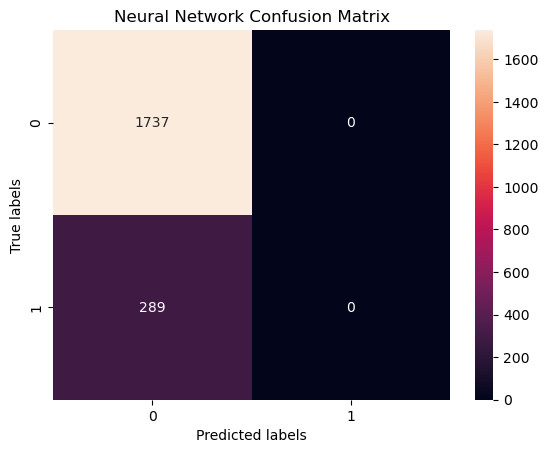

In [74]:
cw = class_weight.compute_class_weight(class_weight = 'balanced', classes= [0,1], y=y_train)

model_ann =  Sequential()
model_ann.add(Dense(19,activation="sigmoid"))
model_ann.add(Dense(10,activation="sigmoid"))
model_ann.add(Dense(1))
model_ann.compile(optimizer='rmsprop',loss = "binary_crossentropy",metrics=["BinaryAccuracy"], loss_weights=weights)



history = model_ann.fit(x=X_train,y=y_train,epochs=80,class_weight = {0:cw[0], 1:cw[1]})

y_pred = model_ann.predict_classes(X_test)   
cm = confusion_matrix(y_test, y_pred)
   

print('\n')
print('Neural Network Accuracy: ', accuracy_score(y_test,y_pred))
print('Neural Network Recall score: ', recall_score(y_test,y_pred))

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt='g')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Neural Network Confusion Matrix')

In [ ]:
plt.title('Loss / binary_crossentropy')
plt.plot(history.history['loss'], label='train')
plt.legend()
plt.show()

<h2>Customer Segmentation</h2>

In [12]:
df.head()

NameError: name 'df' is not defined

In [ ]:
#use label coding instead of one-hot encoding to reduce the number of features
seg_data = deepcopy(df)

le = LabelEncoder()
for feature in categorical_cols:
    seg_data[feature] = le.fit_transform(seg_data[feature])


In [ ]:
seg_data['CLIENTNUM'] = df['CLIENTNUM']

In [ ]:
seg_data.head()

In [ ]:
# get the customers churned
churn = seg_data[seg_data['class']==0]

In [ ]:
churn.shape

In [ ]:
churn.describe()

In [ ]:
churn.columns

In [ ]:
#churn_class = pd.DataFrame(StandardScaler().fit_transform(churn), columns=churn.columns)

#only scale numeric features
churn.drop(columns=["CLIENTNUM"], inplace=True)
churn.drop(columns=["class"], inplace=True)

In [ ]:
churn_class = pd.DataFrame(StandardScaler().fit_transform(churn), columns=churn.columns)


In [ ]:
churn_class


In [ ]:
score = []
inertia = []

for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=1234)
    kmeans.fit(churn_class)
    inertia.append(kmeans.inertia_)
    score.append(silhouette_score(churn_class, kmeans.labels_,sample_size=128, metric='euclidean'))



In [ ]:
score

In [ ]:
n_clusters = range(2, 10)
plt.plot(n_clusters, inertia, "bo--")
plt.xlabel("n_clusters")
plt.ylabel("inertia")
plt.show()

In [ ]:
k = 6

kmeans = KMeans(n_clusters=k, random_state=1234)
kmeans.fit(churn_class_no_scale)
print(kmeans.labels_)

In [ ]:
labels = pd.DataFrame(kmeans.labels_,columns=["label"])
centers = pd.DataFrame(kmeans.cluster_centers_,columns=churn_class_no_scale.columns)
labels_count = pd.DataFrame(labels.value_counts(),columns=["count"]).sort_index()
labels_count = labels_count.reset_index()
final = pd.concat([labels_count,centers],axis=1)
final["class_label"] = ["class_1","class_2","class_3","class_4", "class_5", "class_6"]
final